In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics

import statsmodels.api as sm

import statsmodels.api as sm
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.linear_model import Lasso, Ridge, SGDRegressor
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures,MinMaxScaler
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import mean_squared_error

import seaborn as sb
%matplotlib inline
import tabulate
from IPython.display import HTML, display

plt.rcParams["figure.figsize"] = (12, 9) # (w, h)


In [31]:
df = pd.read_json('./Lucas2018PointsWithWeatherDataSweden.json')
print(df.shape)
print(df.columns)

(1898, 39)
Index(['D0_CloudCover_Afternoon', 'D0_Humidity_Afternoon',
       'D0_Pressure_Afternoon', 'D0_Percipitation_Total', 'D0_Temperature_Min',
       'D0_Temperature_Max', 'D0_Temperature_Afternoon',
       'D0_Temperature_Night', 'D0_Temperature_Evening',
       'D0_Temperature_Morning', 'D0_MaxWind_Speed', 'D0_MaxWind_Direction',
       'POINTID', 'Depth', 'pH_CaCl2', 'pH_H2O', 'EC', 'OC', 'CaCO3', 'P', 'N',
       'K', 'OC_2030_cm', 'CaCO3_2030_cm', 'Ox_Al', 'Ox_Fe', 'NUTS_0',
       'NUTS_1', 'NUTS_2', 'NUTS_3', 'TH_LAT', 'TH_LONG', 'SURVEY_DATE',
       'Elev', 'LC', 'LU', 'LC0_Desc', 'LC1_Desc', 'LU1_Desc'],
      dtype='object')


### Selecting interesting cols only and checking for NA values

In [33]:
df = df[['D0_CloudCover_Afternoon', 'D0_Humidity_Afternoon',
       'D0_Pressure_Afternoon', 'D0_Percipitation_Total', 'D0_Temperature_Min',
       'D0_Temperature_Max', 'D0_Temperature_Afternoon',
       'D0_Temperature_Night', 'D0_Temperature_Evening',
       'TH_LAT', 'TH_LONG', 'D0_Temperature_Morning','pH_CaCl2', 'pH_H2O', 'EC', 'P', 'N','K']]
for col in ['P', 'N', 'K']:
    df.loc[df[col]=='< LOD', col] = 0
    df.loc[df[col]=='<0.0', col] = 0
    df.loc[df[col]=='< 0.0', col] = 0
    df[col]=df[col].astype(float)


In [34]:
for col in df.columns:
    df[col]=df[col].astype(float)
df.dtypes

D0_CloudCover_Afternoon     float64
D0_Humidity_Afternoon       float64
D0_Pressure_Afternoon       float64
D0_Percipitation_Total      float64
D0_Temperature_Min          float64
D0_Temperature_Max          float64
D0_Temperature_Afternoon    float64
D0_Temperature_Night        float64
D0_Temperature_Evening      float64
TH_LAT                      float64
TH_LONG                     float64
D0_Temperature_Morning      float64
pH_CaCl2                    float64
pH_H2O                      float64
EC                          float64
P                           float64
N                           float64
K                           float64
dtype: object

In [35]:
df.head()

,D0_CloudCover_Afternoon,D0_Humidity_Afternoon,D0_Pressure_Afternoon,D0_Percipitation_Total,D0_Temperature_Min,D0_Temperature_Max,D0_Temperature_Afternoon,D0_Temperature_Night,D0_Temperature_Evening,TH_LAT,TH_LONG,D0_Temperature_Morning,pH_CaCl2,pH_H2O,EC,P,N,K
0,90.0,73.0,1013.0,3.70,283.359985,288.290009,286.059998,285.359985,286.019989,57.646988,12.961219,286.790009,3.8,4.11,61.90,27.3,19.2,292.7
1,68.0,65.0,1006.0,0.20,287.660004,292.329987,291.459991,288.970001,289.239990,59.424225,13.182595,289.549988,3.4,4.17,7.32,22.0,4.1,87.5
2,90.0,85.0,1010.0,3.60,284.649994,288.529999,286.880005,288.309998,284.649994,57.748528,13.238009,287.769989,3.1,4.06,5.77,NaN,2.6,63.7
3,20.0,77.0,1024.0,0.65,277.209991,285.339996,284.570007,282.799988,279.649994,56.525760,13.199473,282.600006,5.5,5.98,26.44,73.0,4.5,77.8
4,100.0,49.0,1029.0,0.00,270.049988,285.339996,284.959991,271.910004,281.200012,57.487030,14.215924,280.390015,4.2,4.62,5.17,21.1,1.8,38.5


In [36]:
corr=df.corr(method='spearman', numeric_only=True)
np.around(corr,2)

,D0_CloudCover_Afternoon,D0_Humidity_Afternoon,D0_Pressure_Afternoon,D0_Percipitation_Total,D0_Temperature_Min,D0_Temperature_Max,D0_Temperature_Afternoon,D0_Temperature_Night,D0_Temperature_Evening,TH_LAT,TH_LONG,D0_Temperature_Morning,pH_CaCl2,pH_H2O,EC,P,N,K
D0_CloudCover_Afternoon,1.00,0.27,-0.05,0.26,-0.05,-0.15,-0.17,-0.09,-0.06,0.09,0.04,-0.12,-0.07,-0.07,-0.05,-0.01,-0.03,-0.03
D0_Humidity_Afternoon,0.27,1.00,-0.23,0.44,-0.15,-0.47,-0.51,-0.16,-0.33,0.03,0.03,-0.39,-0.09,-0.10,-0.02,-0.04,-0.01,-0.04
D0_Pressure_Afternoon,-0.05,-0.23,1.00,-0.31,0.16,0.31,0.34,0.12,0.30,-0.24,-0.23,0.26,0.05,0.05,0.12,0.04,0.09,0.10
D0_Percipitation_Total,0.26,0.44,-0.31,1.00,0.06,-0.12,-0.16,0.09,-0.06,-0.07,-0.04,-0.06,-0.07,-0.07,0.04,-0.01,0.05,0.00
D0_Temperature_Min,-0.05,-0.15,0.16,0.06,1.00,0.81,0.80,0.92,0.87,-0.42,-0.20,0.86,0.06,0.07,0.26,0.10,0.21,0.19
D0_Temperature_Max,-0.15,-0.47,0.31,-0.12,0.81,1.00,0.99,0.74,0.93,-0.32,-0.15,0.96,0.11,0.10,0.18,0.08,0.15,0.12
D0_Temperature_Afternoon,-0.17,-0.51,0.34,-0.16,0.80,0.99,1.00,0.73,0.92,-0.32,-0.16,0.94,0.10,0.10,0.18,0.08,0.15,0.12
D0_Temperature_Night,-0.09,-0.16,0.12,0.09,0.92,0.74,0.73,1.00,0.75,-0.42,-0.20,0.82,0.07,0.07,0.25,0.08,0.20,0.18
D0_Temperature_Evening,-0.06,-0.33,0.30,-0.06,0.87,0.93,0.92,0.75,1.00,-0.35,-0.17,0.92,0.09,0.10,0.21,0.09,0.17,0.15
TH_LAT,0.09,0.03,-0.24,-0.07,-0.42,-0.32,-0.32,-0.42,-0.35,1.00,0.66,-0.33,-0.02,-0.02,-0.43,-0.12,-0.30,-0.32


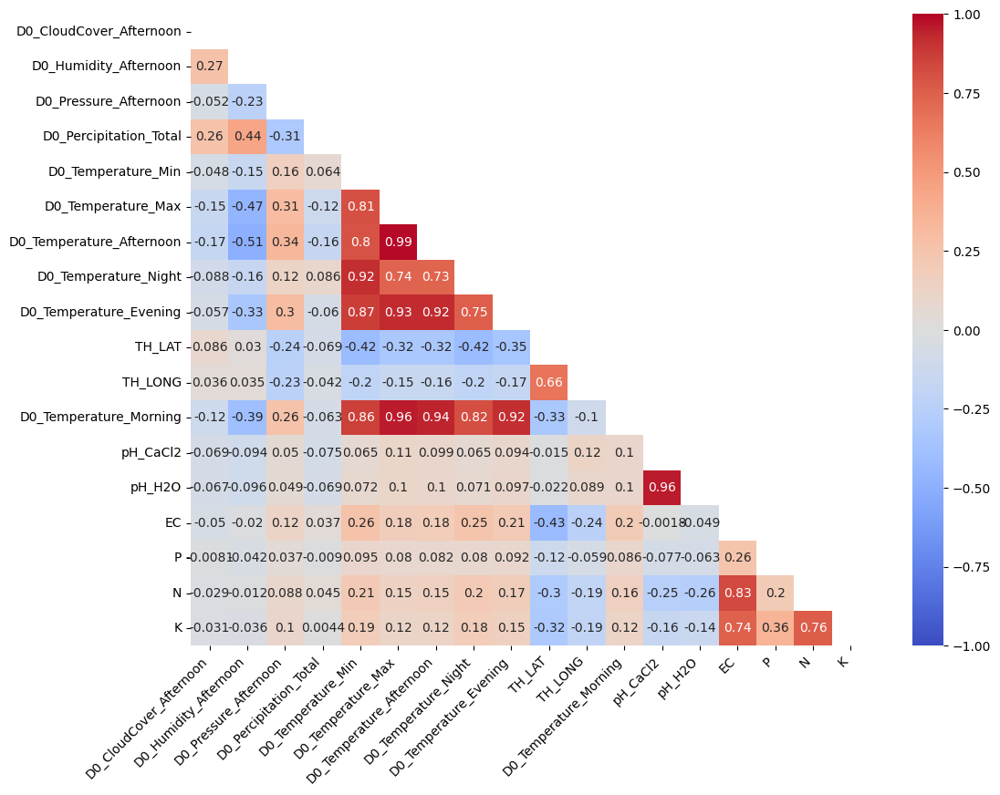

In [37]:
mask = np.zeros_like(corr, dtype=np.bool_)
mask[np.triu_indices_from(mask)] = True

hm=sb.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    #cmap=sb.diverging_palette(20, 220, n=200),
    cmap='coolwarm',
    square=False,
    annot=True,    
    mask=mask
)
hm.set_xticklabels(
    hm.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

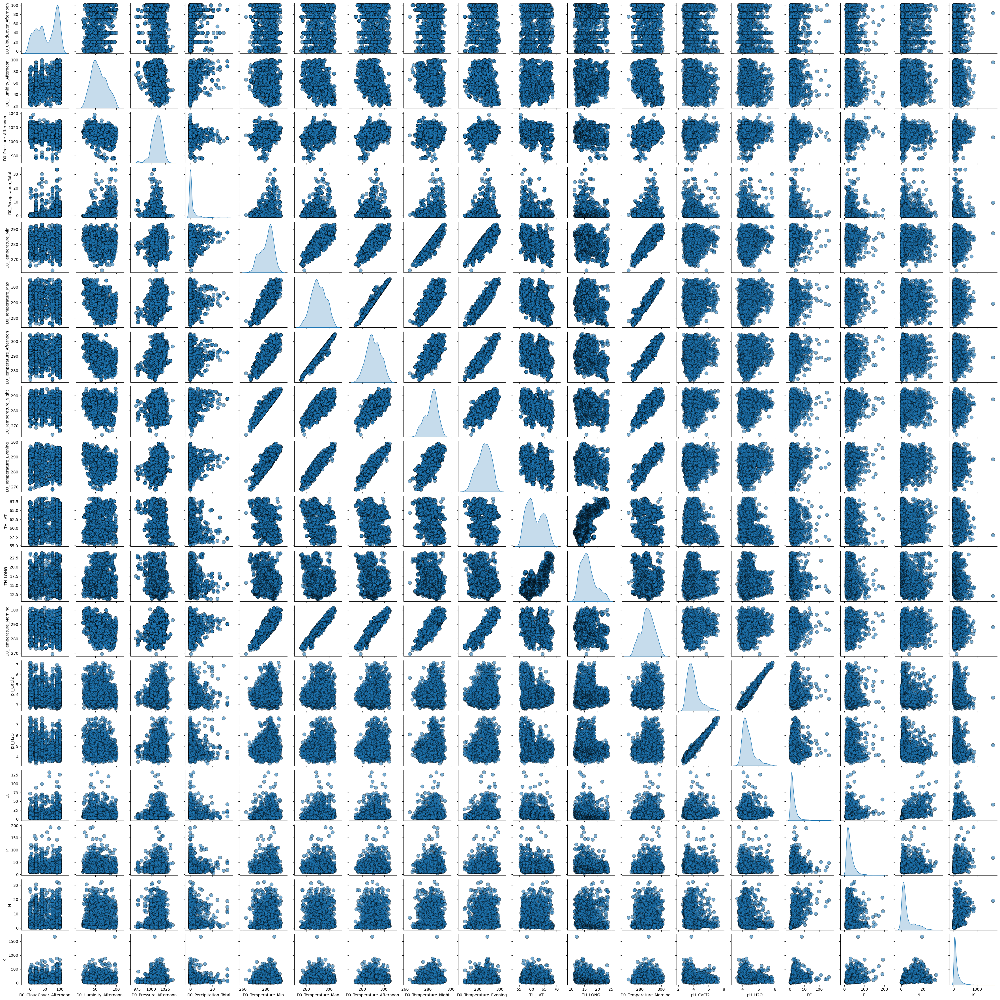

In [38]:
sb.pairplot(
            df,
            diag_kind='kde',
            plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
            height=2
            )


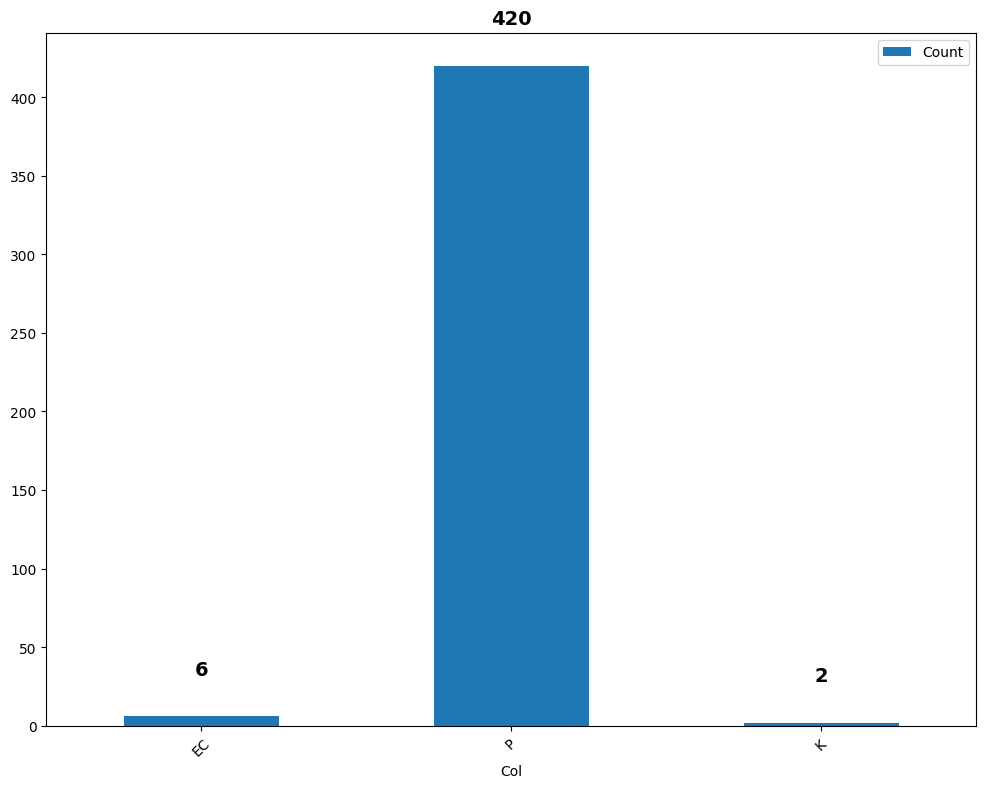

In [39]:
df2 = df.isna().sum().to_frame().reset_index()
df2.columns=["Col","Count"]
df2 =df2.drop(df2[df2["Count"]<=0].index)
plt = df2.plot.bar(x="Col",y="Count",rot=45)

for i, bar in enumerate(plt.axes.patches):
    h = bar.get_height()
    plt.axes.text(
        i, # bar index (x coordinate of text)
        h+30, # y coordinate of text
        '{}'.format(int(h)),  # y label
        ha='center', 
        va='center', 
        fontweight='bold', 
        size=14)

In [40]:
print(df.shape)
df.dropna(inplace=True)
print(df.shape)


(1898, 18)
(1472, 18)


### Random Tree

In [41]:
scaler = MinMaxScaler()
d = scaler.fit_transform(df)
scaled_data = pd.DataFrame(d, columns=df.columns)

In [42]:
features = ['D0_CloudCover_Afternoon', 'D0_Humidity_Afternoon',
       'D0_Pressure_Afternoon', 'D0_Percipitation_Total', 'D0_Temperature_Min',
       'D0_Temperature_Max', 'D0_Temperature_Afternoon',
       'D0_Temperature_Night', 'D0_Temperature_Evening',
       'D0_Temperature_Morning','pH_CaCl2', 'pH_H2O', 'EC', 'TH_LAT', 'TH_LONG']

labels = [ 'P', 'N','K']

y=scaled_data[labels]
X_train,X_test,Y_train,Y_test = train_test_split(
    scaled_data[features],
    y,
    test_size=0.1,
    random_state=9    
    )
print (f"Training Set Size: {X_train.shape[0]}")
print (f"Test Set Size: {X_test.shape[0]}")

Training Set Size: 1324
Test Set Size: 148


#### Random Forest

In [43]:
rf = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=4)
pr=rf.fit(X_train,Y_train)
print(f'R-Squared (train): {rf.score(X_train, Y_train)}')
print(f'R-Squared (test): {rf.score(X_test, Y_test)}')

R-Squared (train): 0.42403965382357495
R-Squared (test): 0.33782103081216847


In [44]:
features = ['D0_CloudCover_Afternoon', 'D0_Humidity_Afternoon',
       'D0_Pressure_Afternoon', 'D0_Percipitation_Total', 'D0_Temperature_Min',
       'D0_Temperature_Max', 'D0_Temperature_Afternoon',
       'D0_Temperature_Night', 'D0_Temperature_Evening',
       'D0_Temperature_Morning','TH_LAT', 'TH_LONG','P', 'N','K']

labels = ['pH_CaCl2', 'pH_H2O', 'EC']

y=scaled_data[labels]
X_train,X_test,Y_train,Y_test = train_test_split(
    scaled_data[features],
    y,
    test_size=0.1,
    random_state=9    
    )
print (f"Training Set Size: {X_train.shape[0]}")
print (f"Test Set Size: {X_test.shape[0]}")

Training Set Size: 1324
Test Set Size: 148


In [45]:
rf = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=4)
pr=rf.fit(X_train,Y_train)
print(f'R-Squared (train): {rf.score(X_train, Y_train)}')
print(f'R-Squared (test): {rf.score(X_test, Y_test)}')

R-Squared (train): 0.5003496677150393
R-Squared (test): 0.38522637122188774
